In [1]:
from fastai import *
from fastai.vision import *

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [62]:
bs = 8
si = 512

In [4]:
path = Path('data/pic/crop')

In [64]:
data = ImageDataBunch.from_folder(path, train = ['train','test'],
                                  valid_pct = 0.25,
                                  seed = 42, 
                                  size = (si, int(si * 1.2)),
                                  classes = ['correct', 'incorrect'],
                                  bs = bs)

In [65]:
data

ImageDataBunch;

Train: LabelList (166 items)
x: ImageList
Image (3, 512, 614),Image (3, 512, 614),Image (3, 512, 614),Image (3, 512, 614),Image (3, 512, 614)
y: CategoryList
incorrect,incorrect,incorrect,incorrect,incorrect
Path: data/pic/crop;

Valid: LabelList (55 items)
x: ImageList
Image (3, 512, 614),Image (3, 512, 614),Image (3, 512, 614),Image (3, 512, 614),Image (3, 512, 614)
y: CategoryList
correct,incorrect,correct,incorrect,incorrect
Path: data/pic/crop;

Test: None

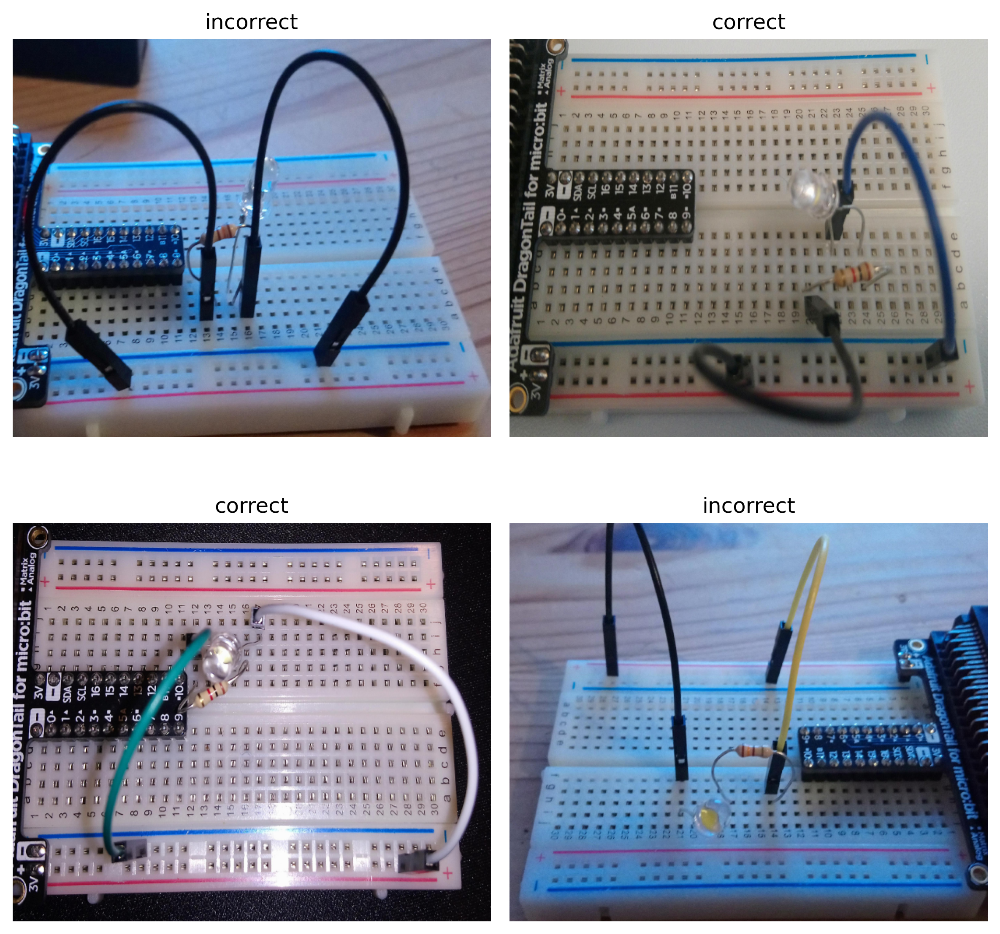

In [66]:
data.show_batch(rows = 2)

In [67]:
learn = cnn_learner(data, models.resnet50, metrics=[accuracy,error_rate])

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.31E-04
Min loss divided by 10: 6.92E-03


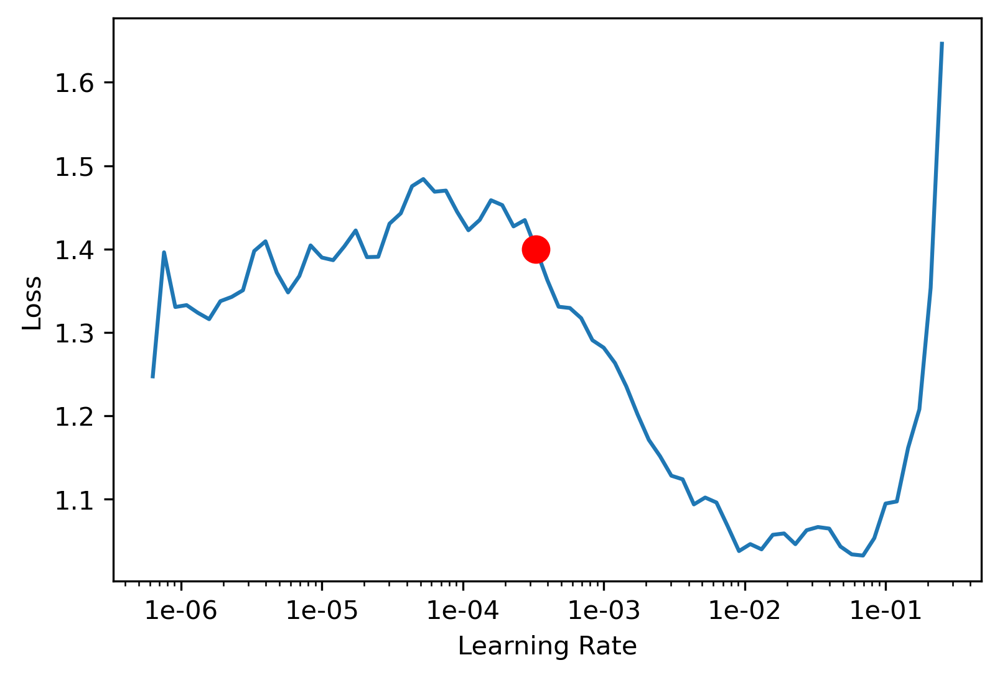

In [68]:
learn.lr_find()
learn.recorder.plot(suggestion = True)

In [69]:
lr = 5e-3

In [70]:
learn.fit_one_cycle(5, lr)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.979785,0.518078,0.745455,0.254545,00:14
1,0.913384,0.808704,0.763636,0.236364,00:14
2,0.752941,1.166368,0.727273,0.272727,00:14
3,0.601842,0.648818,0.763636,0.236364,00:13
4,0.437838,0.608403,0.745455,0.254545,00:13


In [71]:
learn.unfreeze()

In [72]:
learn.fit_one_cycle(15, slice(3e-5,lr))

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.330159,1.012122,0.709091,0.290909,00:15
1,0.396303,0.837157,0.781818,0.218182,00:15
2,0.425604,1.106138,0.690909,0.309091,00:14
3,0.530981,0.807423,0.745455,0.254545,00:15
4,0.586196,2.231718,0.709091,0.290909,00:15
5,0.646268,1.146291,0.727273,0.272727,00:15


KeyboardInterrupt: 

In [50]:
interp = ClassificationInterpretation.from_learner(learn)

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

True

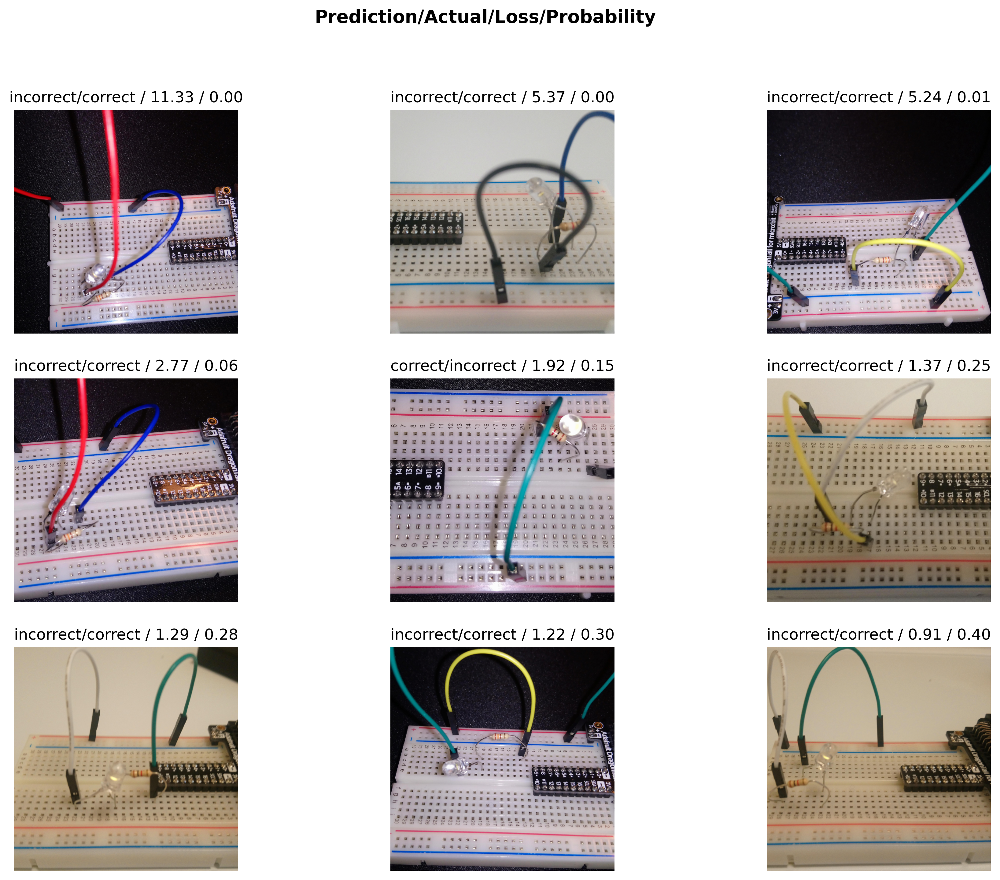

In [51]:
plt.rcParams['figure.dpi'] = 300
interp.plot_top_losses(9, figsize=(15,11))

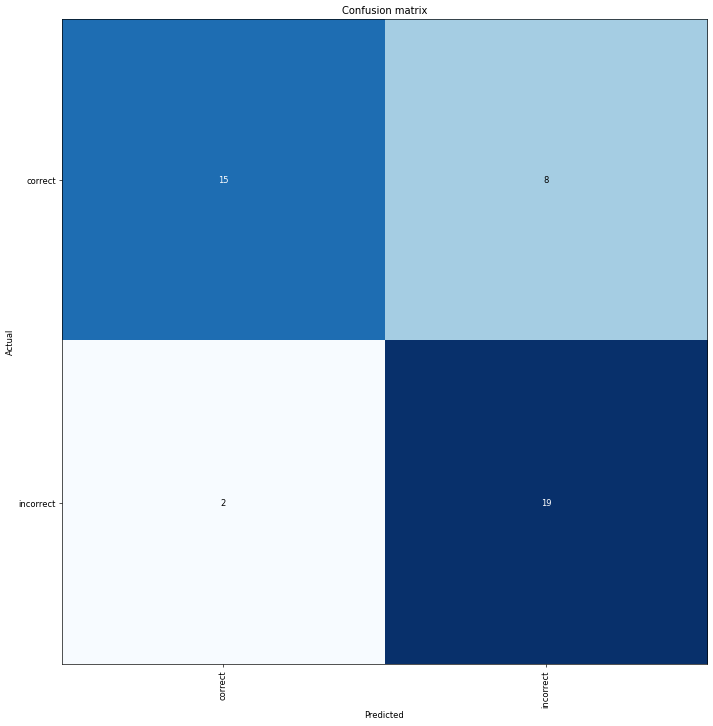

In [52]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)